# OSMnx

https://osmnx.readthedocs.io/en/stable/

OSMnx is a Python package that lets you download geospatial data from OpenStreetMap and model, project, visualize, and analyze real-world street networks and any other geospatial geometries.


In [1]:
import osmnx as ox
import networkx as nx
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import folium

In [2]:
ox.config(use_cache=True, log_console=False)

### Retrieve Street Network from OSM Data

* drive - get drivable public streets (but not service roads)
* drive_service - get drivable streets, including service roads
* walk - get all streets and paths that pedestrians can use (this network type ignores one-way directionality)
* bike - get all streets and paths that cyclists can use
* all - download all non-private OSM streets and paths
* all_private - download all OSM streets and paths, including private-access ones

In [3]:
place = "Basel, Switzerland"
graph = ox.graph_from_place(place, network_type='drive')

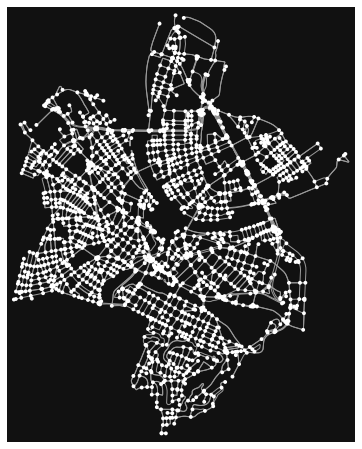

In [4]:
fig, ax = ox.plot_graph(graph)

#### Save Graph as ESRI Shapefile

In [5]:
ox.save_graph_shapefile(graph, filepath='network-shape')

In [6]:
nodes, streets = ox.graph_to_gdfs(graph)

In [7]:
len(streets)

4651

In [8]:
streets.head()

,osmid,bridge,oneway,lanes,ref,highway,maxspeed,length,geometry,name,junction,tunnel,width,access,u,v,key
0,128689911,yes,True,3,A2;A3,motorway,80,373.289,"LINESTRING (7.61560 47.55514, 7.61595 47.55441...",NaN,NaN,NaN,NaN,NaN,453270,453273,0
1,"[748680217, 748680218, 287871181]",yes,True,"[4, 3]",A2;A3,motorway,80,423.063,"LINESTRING (7.61602 47.55185, 7.61596 47.55162...",NaN,NaN,NaN,NaN,NaN,453273,2914357911,0
2,"[102266441, 102266442, 4310932, 4310933]",yes,True,2,NaN,motorway_link,80,504.353,"LINESTRING (7.61730 47.54435, 7.61665 47.54455...",Galerie Gellerthochhaus,NaN,NaN,NaN,NaN,456106,3404666393,0
3,"[22948918, 88967758]",yes,True,2,A2;A3,motorway,80,551.274,"LINESTRING (7.61730 47.54435, 7.61671 47.54463...",NaN,NaN,NaN,NaN,NaN,456106,456113,0
4,"[413310946, 748794012, 185411911]",yes,True,"[4, 3]",A2;A3,motorway,"[60, 80]",463.892,"LINESTRING (7.61537 47.54865, 7.61564 47.54935...",NaN,NaN,NaN,NaN,NaN,456113,1402180932,0


In [9]:
street_types = pd.DataFrame(streets["highway"].apply(pd.Series)[0].value_counts().reset_index())
street_types.columns = ["type", "count"]

In [10]:
street_types

,type,count
0,residential,2428
1,secondary,639
2,primary,441
3,tertiary,399
4,living_street,315
5,unclassified,278
6,secondary_link,50
7,motorway_link,48
8,motorway,30
9,primary_link,13


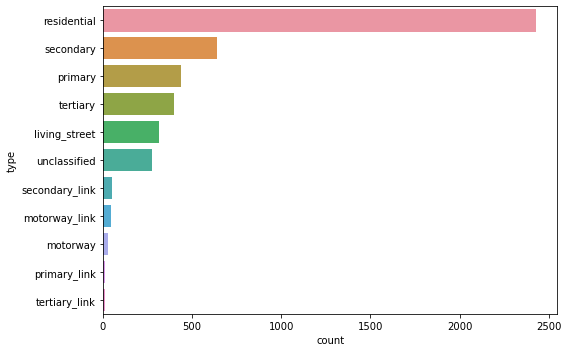

In [11]:
fig, ax = plt.subplots(figsize=(8,5))
sns.barplot(y="type", x="count", data=street_types, ax=ax)
plt.tight_layout()
plt.show();

### Putting the Street Network on a Folium Map

In [12]:
m = folium.Map([47.561086, 7.588686],
zoom_start=13,tiles="CartoDB dark_matter")

jsondata = streets.to_json()

style = {'color': '#FFDD66', 
         'weight':'1'}
folium.GeoJson(jsondata, style_function=lambda x: style).add_to(m)
m

### Routing

There are two train stations in Basel, lets find the route between them:

In [13]:
train_station_1 = ox.geocode('Badischer Bahnhof, Basel Switzerland')
train_station_1

(47.56701545, 7.608946057383559)

In [14]:
train_station_2 = ox.geocode('Bahnhof SBB, Basel, Switzerland')
train_station_2

(47.5483904, 7.5906624)

#### Let's add them as POI to the map **above**:

In [15]:
m = folium.Map([47.561086, 7.588686], zoom_start=13,tiles="CartoDB dark_matter")

#jsondata = streets.to_json()

style = {'color': '#FFDD66', 
         'weight':'1'}
folium.GeoJson(jsondata, style_function=lambda x: style).add_to(m)

folium.Marker(train_station_1, 
              popup="Badischer Bahnhof",
              icon=folium.Icon(color="green", prefix="fa", icon="train")).add_to(m)

folium.Marker(train_station_2, 
              popup="Bahnhof SBB",
              icon=folium.Icon(color="red", prefix="fa", icon="train")).add_to(m)
m

In [16]:
origin_node = ox.get_nearest_node(graph, train_station_1)
destination_node = ox.get_nearest_node(graph, train_station_2)

#### Find the route between the nodes

Using NetworkX module to calculate

In [17]:
route = nx.shortest_path(graph, origin_node, destination_node)

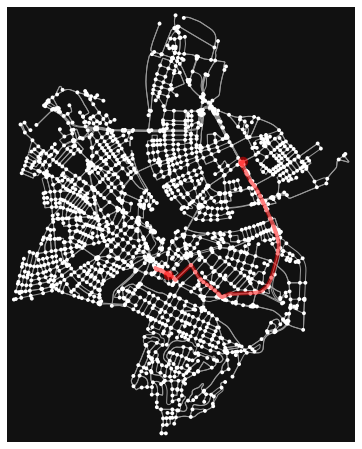

In [18]:
fig, ax = ox.plot_graph_route(graph, route)

In [19]:
from shapely.geometry import LineString

line = []
for i in route:
    point = (graph.nodes[i]['x'],graph.nodes[i]['y'])
    line.append(point)
    print(point)
    
ls = LineString(line)

(7.6081718, 47.5659555)
(7.6078558, 47.5658487)
(7.6076315, 47.5657789)
(7.6077462, 47.5655701)
(7.6079191, 47.5653542)
(7.6089061, 47.5641732)
(7.6107777, 47.5622261)
(7.6131727, 47.5590129)
(7.6155993, 47.5551379)
(7.6160217, 47.5518493)
(7.6145613, 47.5481775)
(7.6110379, 47.5458471)
(7.6039395, 47.5453466)
(7.6033681, 47.5451925)
(7.6033119, 47.5452238)
(7.6032481, 47.5452576)
(7.6026504, 47.5455895)
(7.601761, 47.5462245)
(7.6008573, 47.5466957)
(7.599118, 47.5474866)
(7.5985607, 47.5479133)
(7.5973279, 47.5490592)
(7.5963359, 47.5501362)
(7.5962539, 47.5500813)
(7.592791, 47.5478329)
(7.5925728, 47.5479989)
(7.5882354, 47.5496697)
(7.5899858, 47.5491043)
(7.5903942, 47.54892)
(7.5912621, 47.5485482)


#### Create a GeoDataFrame from the LineString (optional)


In [20]:
gdf_route = pd.DataFrame(data= [['route 1',ls]],columns=['route','geometry'])
gdf_route

,route,geometry
0,route 1,"LINESTRING (7.6081718 47.5659555, 7.6078558 47..."


In [21]:
gdf_route = gpd.GeoDataFrame(gdf_route,geometry='geometry')
gdf_route

,route,geometry
0,route 1,"LINESTRING (7.60817 47.56596, 7.60786 47.56585..."


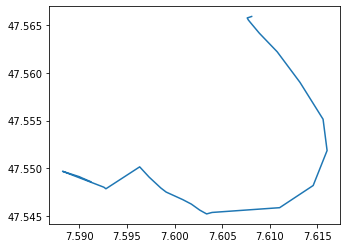

In [22]:
gdf_route.plot();

Convert this route to GeoJSON

In [23]:
jsonroute = gdf_route.to_json()

In [24]:
m = folium.Map([47.561086, 7.588686], zoom_start=13,tiles="CartoDB dark_matter")

#jsondata = streets.to_json()

style = {'color': '#FFDD66', 
         'weight':'1'}

route_style = {'color': '#FF0000',
              'weight' : '4'}

folium.GeoJson(jsondata, style_function=lambda x: style).add_to(m)
folium.GeoJson(jsonroute, style_function=lambda x: route_style).add_to(m)

folium.Marker(train_station_1, 
              popup="Badischer Bahnhof",
              icon=folium.Icon(color="green", prefix="fa", icon="train")).add_to(m)

folium.Marker(train_station_2, 
              popup="Bahnhof SBB",
              icon=folium.Icon(color="red", prefix="fa", icon="train")).add_to(m)
m

### Building Footprints

In [25]:
buildings = ox.geometries_from_place("Basel, Switzerland", tags={'building':True})

buildings.shape

(24535, 190)

In [26]:
buildings.head()

/opt/anaconda3/envs/geopython/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,unique_id,osmid,element_type,access,amenity,centralkey,changing_table,fee,opening_hours,toilets:disposal,...,bike_ride,bin,ways,addr:place,refugee,type,name:es,drink:club-mate,name:ar,wall
0,node/800123119,800123119,node,NaN,NaN,NaN,NaN,NaN,24/7,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,node/1581313628,1581313628,node,NaN,NaN,NaN,NaN,yes,We-Su 11:00-17:00,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,node/2701722328,2701722328,node,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,node/2701722329,2701722329,node,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,node/2701722330,2701722330,node,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


/opt/anaconda3/envs/geopython/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


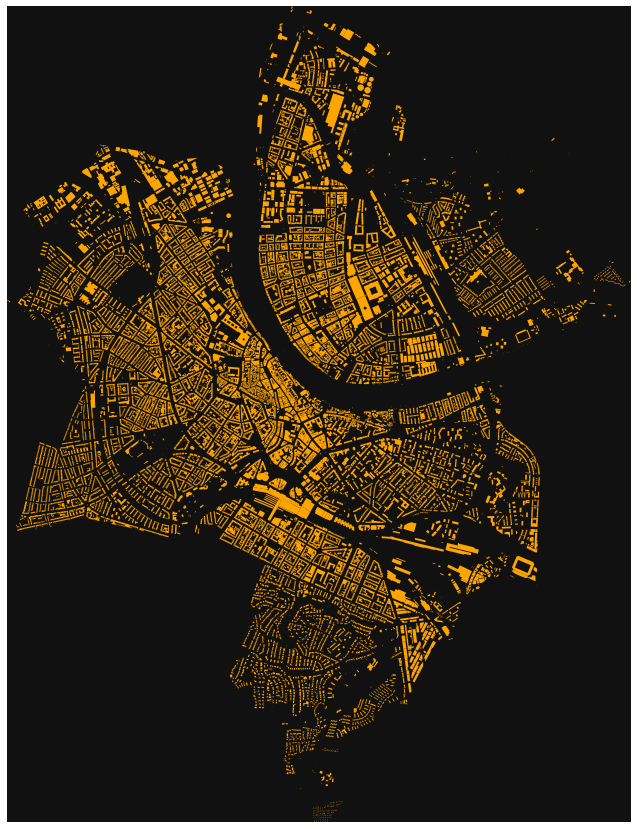

In [27]:
ox.plot_footprints(buildings, figsize=(16,15));

### Retrieving Buildings

In [28]:
museum = buildings.query("tourism == 'museum'")
museum = museum[['name', 'geometry']]
museum.head(20)

/opt/anaconda3/envs/geopython/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,name,geometry
1,Historisches Museum Basel – Musikmuseum,POINT (7.58784 47.55480)
28,Papiermuseum,"POLYGON ((7.60348 47.55458, 7.60333 47.55458, ..."
893,Historisches Museum Basel – Haus zum Kirschgarten,"POLYGON ((7.59137 47.55228, 7.59141 47.55225, ..."
897,Historisches Museum Basel – Haus zum Kirschgarten,"POLYGON ((7.59119 47.55196, 7.59119 47.55197, ..."
1454,Historisches Museum Basel – Barfüsserkirche,"POLYGON ((7.59101 47.55435, 7.59102 47.55432, ..."
1475,Naturhistorisches Museum Basel,"POLYGON ((7.59006 47.55728, 7.58994 47.55739, ..."
2453,Kunstmuseum Basel | Gegenwart,"POLYGON ((7.60146 47.55463, 7.60148 47.55456, ..."
5058,Jüdisches Museum der Schweiz Galerie,"POLYGON ((7.58450 47.55892, 7.58485 47.55891, ..."
5068,Kunstmuseum Basel | Neubau,"POLYGON ((7.59475 47.55455, 7.59489 47.55459, ..."
9331,Museum Tinguely,"POLYGON ((7.61237 47.55947, 7.61238 47.55948, ..."


/opt/anaconda3/envs/geopython/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


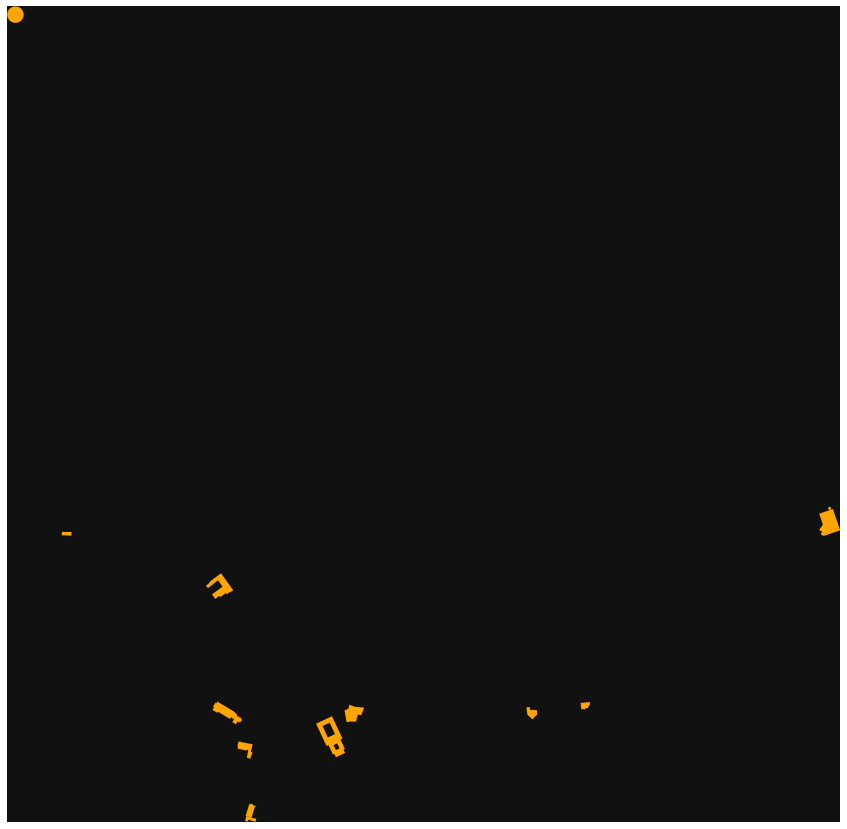

In [29]:
ox.plot_footprints(museum, figsize=(16,15));

### Putting those Buildings on a Folium Map

In [30]:
import html

m = folium.Map([47.561086, 7.588686],zoom_start=15)


style = {'color': '#FF0000',
         'fillColor': '#FFFF00',
         'weight':'2'
        }

def building(building):
    jsondata = gpd.GeoSeries([building["geometry"]]).to_json()
    name = html.escape(building["name"]) 
    folium.GeoJson(jsondata, style_function=lambda x: style).add_child(folium.Popup(name)).add_to(m)

museum.apply(building, axis=1)

m.save("museums.html")
m

/opt/anaconda3/envs/geopython/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


### Creating POI out of buildings

In [31]:
def get_geometry(x):
    g = x["geometry"]
    c = g.centroid
    return c
   
centroid = museum.apply(get_geometry, axis=1)

In [32]:
museum["centroid"] = centroid 

In [33]:
museum.head()

,name,geometry,centroid
1,Historisches Museum Basel – Musikmuseum,POINT (7.58784 47.55480),POINT (7.587842 47.5548029)
28,Papiermuseum,"POLYGON ((7.60348 47.55458, 7.60333 47.55458, ...",POINT (7.603466924434003 47.55467180653731)
893,Historisches Museum Basel – Haus zum Kirschgarten,"POLYGON ((7.59137 47.55228, 7.59141 47.55225, ...",POINT (7.591340455486172 47.5520986314695)
897,Historisches Museum Basel – Haus zum Kirschgarten,"POLYGON ((7.59119 47.55196, 7.59119 47.55197, ...",POINT (7.591334572502808 47.55189064463953)
1454,Historisches Museum Basel – Barfüsserkirche,"POLYGON ((7.59101 47.55435, 7.59102 47.55432, ...",POINT (7.590475405278937 47.55450122673016)


In [34]:
import html

m = folium.Map([47.561086, 7.588686],zoom_start=15)


def building(building):
    lng = building["centroid"].x
    lat = building["centroid"].y

    name = html.escape(building["name"])
   
    folium.Marker([lat,lng], 
              popup=name,
              icon=folium.Icon(color="red", prefix="fa", icon="university")).add_to(m)


museum.apply(building, axis=1)

m

/opt/anaconda3/envs/geopython/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


### Retrieve POI from OSM

In [35]:
atm = ox.pois_from_place("Basel, Switzerland", tags={'amenity': 'atm'})

/opt/anaconda3/envs/geopython/lib/python3.7/site-packages/osmnx/pois.py:135: UserWarning: The `pois` module has been deprecated and will be removed in a future release. Use the `geometries` module's `geometries_from_place` function instead.
  warnings.warn(msg)


In [36]:
len(atm)

/opt/anaconda3/envs/geopython/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


63

In [37]:
atm.head()

,unique_id,osmid,element_type,amenity,check_date,drive_through,operator,wheelchair,geometry,brand,...,fee,network,payment:notes,payment:onchain,website,contact:email,lit,brand:wikipedia,operator:wikipedia,speech_output
0,node/362067231,362067231,node,atm,2023-01-08,no,Raiffeisen,yes,POINT (7.58968 47.54773),NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,node/362068593,362068593,node,atm,2022-02-11,NaN,Basler Kantonalbank,NaN,POINT (7.58847 47.54605),Basler Kantonalbank,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,node/387160496,387160496,node,atm,NaN,NaN,PostFinance,NaN,POINT (7.59236 47.55156),NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,node/567445414,567445414,node,atm,NaN,NaN,Basler Kantonalbank,limited,POINT (7.58841 47.55273),BKB,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,node/703589057,703589057,node,atm,NaN,NaN,NaN,NaN,POINT (7.57812 47.57453),NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [38]:
import html

m = folium.Map([47.561086, 7.588686],zoom_start=15)


def atm2poi(x):
    lng = x["geometry"].x
    lat = x["geometry"].y
    operator = x["operator"]

    if type(operator) == str:
        name = html.escape(operator)
    else:
        name = "unkown bank"
   
    folium.Marker([lat,lng], 
              popup=name,
              icon=folium.Icon(color="green", prefix="fa", icon="credit-card")).add_to(m)


atm.apply(atm2poi, axis=1)

m

/opt/anaconda3/envs/geopython/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
